<table>
    <tr>
        <td>
            <h1>Introduction au GANs</h1>
        </td>
    </tr>
</table>


<center><i>Réalisé par : </i>Douba JAFUNO </center>

<table>
    <tr style="text-align: center;vertical-align:middle">
    <td style="border-top: 1px solid black; border-bottom: 1px solid black;vertical-align: middle">     
 <h1>Plan du rapport</h1>
    </td>
   </tr>
</table>
 
<table style="width: 100%">
<tr>
    <td style="width: 15%">
    </td>
    <td style="width: 70%; text-align:left">
        <a href="#1"><h1>I. Introduction</h1></a><br>
           &emsp; <a href="#presentation">I.1 Présentation du problème</a><br>
           &emsp; <a href="#preparation">I.2 Préparation et Visualisation des données</a><br><br>

<a href="#2"><h1>II. Architecture DCGAN</h1></a><br><br>
    &emsp; <a href="#gen">II.1 Le générateur</a><br>
    &emsp; <a href="#dis">II.2 Le discriminateur</a><br>
  
    

<a href="#3"><h1>III. Pertes et Optimiseur</h1></a><br><br>
    &emsp; <a href="#pg">III.1 Perte du générateur</h1></a><br>
    &emsp; <a href="#pd">III.2 Perte du discriminateur</h1></a><br>
    &emsp; <a href="#opt">III.3 Optimiseur</h1></a><br>
    
<a href="#4"><h1>IV. Boucle d'apprentissage</h1></a><br><br>
    &emsp; <a href="#ent">IV.1 Entraînement</h1></a><br>
    &emsp; <a href="#vag">IV.2 Visualisation avec un Gif</h1></a><br>
<a href="#5"><h1>V. Conclusion </h1></a><br><br>
     &nbsp; <a href="#ref">V.1 Références</a><br>
    </td>
    <td style="width: 0%">
    </td>
</tr>
</table>



# <a name="1">I. Introduction</a>

## <a name="presentation"> Présentation du problème </a>

[Fashion MNIST](https://www.kaggle.com/zalando-research/fashionmnist) est un jeu de données contenant 70 000 images en niveaux de gris répartie sur 1 des 10 catégories. Les images de dimension 28 x 28 pixels, montrent des vêtements, d'articles de Zalando. 

La base de données est repartie en un ensemble de 60.000 exemples de formation et d'un ensemble de 10.000 exemples de test Cette base de données vise à remplacer le jeu de données [MNIST](https://www.kaggle.com/c/digit-recognizer) (de chiffres écrit à la main) plus assez complexe dans une logique d'apprentissage automatique.

Notre but sera d'utiliser les **GANs: Generative Adversarial Networks**, les réseaux adverses génératifs en français sur nos images Fashion Mnist. Les GANs sont une classe d'algorithmes d'**apprentissage non supervisé**. Ces algorithmes ont été introduits par [Goodfellow et al. 2014](https://arxiv.org/pdf/1406.2661.pdf). Ils permettent de générer des images avec un fort degré de réalisme. il éxiste de nombreux modèle de GANs mais celui que nous utiliserons sera le Réseau Adversaire Génératif Convolutionnel Profond dit **DCGAN** (Deep Convolutional Generative Adversarial Network). 

## <a name="preparation"> Préparation et Visualisation des données </a>

In [1]:
from pathlib import Path
import imageio
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import (Dense, Reshape, Flatten, Dropout,
                                     BatchNormalization, LeakyReLU,
                                     Conv2D, Conv2DTranspose)
from tensorflow.keras.models import Sequential
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

from IPython import display

In [2]:

gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if gpu_devices:
    print('Utilisation du GPU')
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
else:
    print('Utilisation du CPU')

Utilisation du GPU


On crée un dossier **images synthétique** qui contiendra nos images crée à par la fonction **train** que l'on verra.

In [3]:
dcgan_path = Path('dcgan')
img_path = dcgan_path / 'images_synthétique'
if not img_path.exists():
    img_path.mkdir(parents=True)

On définit une fonction qui nous servira à sauvegarder nos images.

In [4]:
def generate_and_save_images(model, epoch, test_input):
    # Entraînement réglé sur faux pour que chaque couche fonctionne en mode d'inférence
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(5, 5.2))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    fig.suptitle(f'Epoch {epoch:03d}', fontsize=14)
    fig.tight_layout()
    fig.subplots_adjust(top=.93)
    fig.savefig(img_path / f'epoch_{epoch:03d}.png', dpi=300)
    plt.show()

Utilisons uniquement des images de train de fashion mnist.

In [5]:
(train_images, train_labels), (_, _) = fashion_mnist.load_data()

Obtenons la dimensionnalité des images train que nous stockons dans n_images

In [6]:
n_images = train_images.shape[0]
h = w = 28  # taille hauteur largeur de l'image

On redimensionne 

In [7]:
train_images = (train_images
                .reshape(n_images, h, w, 1)
                .astype('float32'))

Normalisons les images entre -1 et 1

In [8]:
train_images = (train_images - 127.5) / 127.5

In [9]:
BUFFER_SIZE = n_images
BATCH_SIZE = 256

Créeons tf.data.Dataset

In [10]:
train_set = (tf.data.Dataset
             .from_tensor_slices(train_images)
             .shuffle(BUFFER_SIZE)
             .batch(BATCH_SIZE))

In [11]:
train_set

<BatchDataset shapes: (None, 28, 28, 1), types: tf.float32>

# <a name="2">II. Architecture DCGAN</a>



Les réseaux adversaux générateurs g se composent de deux modèles :

- Le premier modèle est appelé **Générateur** et vise à générer de nouvelles données similaires à celles attendues. Le Générateur pourrait être assimilé à un faussaire d'art humain, qui crée de fausses œuvres d'art ici il s'agit de nos **images de Fashion Mnist**.

- Le second modèle est appelé le **Discriminateur**. Le but de ce modèle est de reconnaître si une donnée d'entrée est **réelle** - elle appartient à l'ensemble de données d'origine - ou si elle est **fausse** - générée par un faussaire. Dans ce scénario, un discriminateur est analogue à un expert en art, qui essaie de détecter les œuvres d'art comme étant vraies ou fausses.


![](https://miro.medium.com/max/2850/1*eB7mfnfoAfZCZ-bOr7SImQ.jpeg)

Le générateur et le discriminateur sont définis à l'aide de l' [API séquentielle Keras](https://www.tensorflow.org/guide/keras). voyons voir leurs architecture dans le **DCGAN**.



## <a name="gen"> Le générateur </a>
- Le générateur générera des vêtements ressemblant aux données Fashion Mnist.

- Le générateur utilise [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2DTranspose) (suréchantillonnage) pour produire une image à partir d'une graine (bruit aléatoire).   

Pour le modèle du générateur: 

- Commençons avec une couche Dense qui prend cette graine comme entrée, puis suréchantillonnons plusieurs fois jusqu'à ce que nous atteignons la taille d'image souhaitée de 28x28x1. Notons la présence de la fonction d'activation de [tf.keras.layers.LeakyReLU](https://www.tensorflow.org/api_docs/python/tf/keras/layers/LeakyReLU) pour chaque couche, sauf la couche de sortie qui utilise tanh.

In [12]:
def build_generator():
    return Sequential([Dense(7 * 7 * 256, 
                             use_bias=False,
                             input_shape=(100,), 
                             name='IN'),
                       BatchNormalization(name='BN1'),
                       LeakyReLU(name='RELU1'),
                       Reshape((7, 7, 256), name='SHAPE1'),
                       Conv2DTranspose(128, (5, 5), 
                                       strides=(1, 1),
                                       padding='same', 
                                       use_bias=False,
                                       name='CONV1'),
                       BatchNormalization(name='BN2'),
                       LeakyReLU(name='RELU2'),
                       Conv2DTranspose(64, (5, 5), 
                                       strides=(2, 2),
                                       padding='same', use_bias=False,
                                       name='CONV2'),
                       BatchNormalization(name='BN3'),
                       LeakyReLU(name='RELU3'),
                       Conv2DTranspose(1, (5, 5), 
                                       strides=(2, 2),
                                       padding='same', 
                                       use_bias=False,
                                       activation='tanh', 
                                       name='CONV3')],
                      name='Generator')

In [13]:
generator = build_generator()

In [14]:
generator.summary()

Model: "Generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
IN (Dense)                   (None, 12544)             1254400   
_________________________________________________________________
BN1 (BatchNormalization)     (None, 12544)             50176     
_________________________________________________________________
RELU1 (LeakyReLU)            (None, 12544)             0         
_________________________________________________________________
SHAPE1 (Reshape)             (None, 7, 7, 256)         0         
_________________________________________________________________
CONV1 (Conv2DTranspose)      (None, 7, 7, 128)         819200    
_________________________________________________________________
BN2 (BatchNormalization)     (None, 7, 7, 128)         512       
_________________________________________________________________
RELU2 (LeakyReLU)            (None, 7, 7, 128)         0 

In [15]:
import pydot

In [16]:
from tensorflow.keras.utils import plot_model

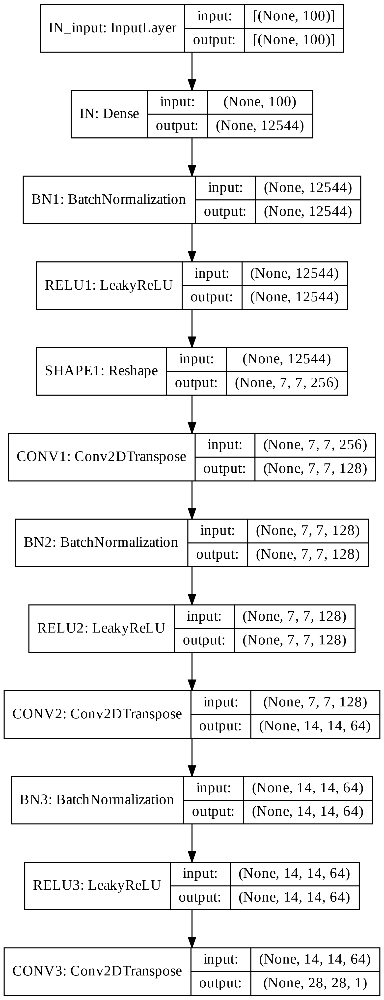

In [17]:
plot_model(generator,
           show_shapes=True,
           dpi=300,
           to_file=(dcgan_path / 'generator.png').as_posix())

Utilisons le générateur (encore inexpérimenté) pour créer une image.

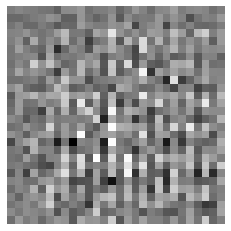

In [18]:
noise = tf.random.normal([1, 100])
generated_img = generator(noise, training=False)

plt.imshow(generated_img[0, :, :, 0], cmap='gray')
plt.axis('off');

## <a name="dis"> Le discriminateur </a>
Le discriminateur est un classificateur d'image basé sur CNN. :

In [19]:
def build_discriminator():
    return Sequential([Conv2D(64, (5, 5), 
                              strides=(2, 2), 
                              padding='same',
                              input_shape=[28, 28, 1], 
                              name='CONV1'),
                       LeakyReLU(name='RELU1'),
                       Dropout(0.3, name='DO1'),
                       Conv2D(128, (5, 5), 
                              strides=(2, 2),
                              padding='same', 
                              name='CONV2'),
                       LeakyReLU(name='RELU2'),
                       Dropout(0.3, name='DO2'),
                       Flatten(name='FLAT'),
                       Dense(1, name='OUT')],
                      name='Discriminator')

In [20]:
discriminator = build_discriminator()

In [21]:
discriminator.summary()

Model: "Discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
CONV1 (Conv2D)               (None, 14, 14, 64)        1664      
_________________________________________________________________
RELU1 (LeakyReLU)            (None, 14, 14, 64)        0         
_________________________________________________________________
DO1 (Dropout)                (None, 14, 14, 64)        0         
_________________________________________________________________
CONV2 (Conv2D)               (None, 7, 7, 128)         204928    
_________________________________________________________________
RELU2 (LeakyReLU)            (None, 7, 7, 128)         0         
_________________________________________________________________
DO2 (Dropout)                (None, 7, 7, 128)         0         
_________________________________________________________________
FLAT (Flatten)               (None, 6272)            

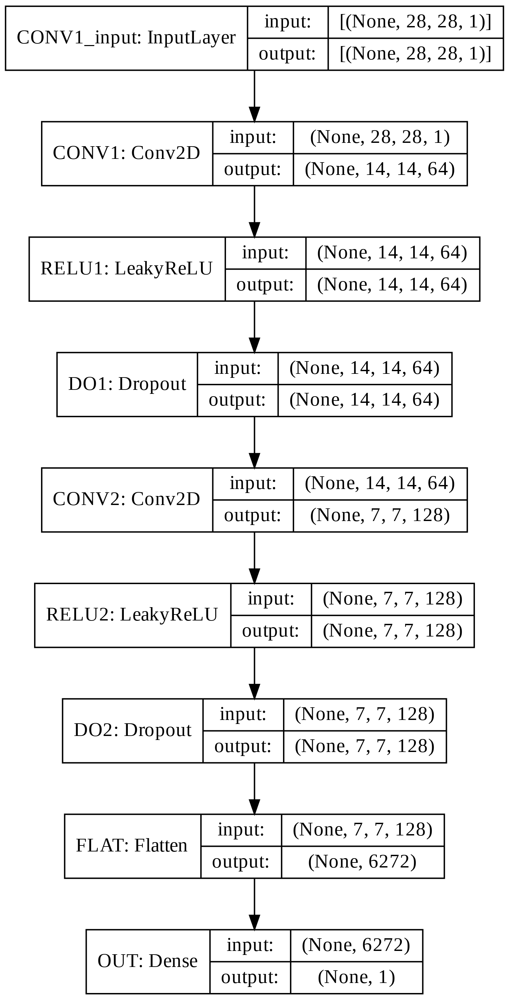

In [22]:
plot_model(discriminator,
           show_shapes=True,
           dpi=300,
           to_file=(dcgan_path / 'discriminator.png').as_posix())

In [23]:
discriminator(generated_img).numpy()

array([[0.00022184]], dtype=float32)

# <a name="3">III. Pertes et Optimiseur</a>

Définissez les fonctions de perte et les optimiseurs pour les deux modèles.

In [24]:
cross_entropy = BinaryCrossentropy(from_logits=True)

## <a name="pg"> Perte du générateur </a>
La perte du générateur quantifie à quel point il a réussi à tromper le discriminateur. Intuitivement, si le générateur fonctionne bien, le discriminateur classera les fausses images comme réelles (ou 1). Ici, nous comparerons les décisions des discriminateurs sur les images générées à un tableau de 1.

In [25]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

## <a name="pd">Perte du discriminateur</a>

Cette méthode quantifie à quel point le discriminateur est capable de distinguer les images réelles des fausses. Il compare les prédictions du discriminateur sur des images réelles à un tableau de 1, et les prédictions du discriminateur sur de fausses images (générées) à un tableau de 0.

In [26]:
def discriminator_loss(true_output, fake_output):
    true_loss = cross_entropy(tf.ones_like(true_output), true_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return true_loss + fake_loss

Les pertes du générateur et du discriminateur semblent différentes à la fin, même si elles dérivent d'une seule formule.

Perte Minimax
Dans l'article qui a introduit les GAN, le générateur essaie de minimiser la fonction suivante tandis que le discriminateur essaie de la maximiser:  $$E_x[log(D(x))] + E_z[log(1 - D(G(z)))]$$

Dans cette fonction:

- $D(x)$ est l'estimation par le discriminateur de la probabilité que l'instance de données réelle x soit réelle.
- $E_x$ est la valeur attendue sur toutes les instances de données réelles.
- $G(z)$ est la sortie du générateur lorsque le bruit z est donné.
- $D(G(z))$ est l'estimation par le discriminateur de la probabilité qu'une fausse instance soit réelle.
- $E_z$ est la valeur attendue sur toutes les entrées aléatoires du générateur (en fait, la valeur attendue sur toutes les fausses instances générées $G(z)$).
- La formule dérive de l' **entropie croisée** (cross_entropy) entre les distributions réelle et générée.

Le générateur ne peut pas affecter directement le $log(D(x))$ terme dans la fonction, donc, pour le générateur, minimiser la perte équivaut à minimiser $log(1 - D(G(z)))$.


Il y'a aussi une Perte Minimax modifiée en effet le document original du GAN note que la fonction de perte minimax ci-dessus peut entraîner le blocage du GAN dans les premières étapes de la formation au GAN lorsque le travail du discriminateur est très facile. Le papier suggère donc de modifier la perte du générateur afin que le générateur essaie de maximiser log D(G(z)).

## <a name="opt"> Optimiseur </a>

On choisie l'optimiseur [Adam](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/).

Le discriminateur et les optimiseurs de générateur sont différents puisque nous allons former deux réseaux séparément.

In [27]:
gen_optimizer = Adam(1e-4)
dis_optimizer = Adam(1e-4)

Enregistrons les points de contrôle
Ce bloc-notes montre également comment enregistrer et restaurer des modèles, ce qui peut être utile en cas d'interruption d'une tâche d'entraînement de longue durée.

In [28]:
checkpoints_dir = dcgan_path / 'training_chpk'
checkpoint_prefix = checkpoints_dir / 'ckpt'
checkpoint = tf.train.Checkpoint(gen_optimizer=gen_optimizer,
                                 dis_optimizer=dis_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# <a name="4">IV. Boucle d'apprentissage</a>



In [29]:
EPOCHS = 100
noise_dim = 100

In [30]:
# pour la génération de gif
num_ex_to_gen = 16
seed = tf.random.normal([num_ex_to_gen, noise_dim])

La boucle d'apprentissage commence avec le générateur recevant une graine aléatoire en entrée. Cette graine est utilisée pour produire une image. Le discriminateur est ensuite utilisé pour classer des images réelles (tirées de l'ensemble d'apprentissage) et des images factices (produites par le générateur). La perte est calculée pour chacun de ces modèles, et les gradients sont utilisés pour mettre à jour le générateur et le discriminateur. L'apprentissage peut être modélisé comme un jeu à somme nulle.
L'apprentissage de ces réseaux est difficile en pratique, avec des problèmes importants de non convergence

In [31]:
@tf.function
def train_step(images):
    # générons l'entrée aléatoire pour le générateur
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # obtenons la sortie du générateur
        generated_img = generator(noise, training=True)
        
        # collectons les décisions discriminatoires concernant les entrées réelles et fausses
        true_output = discriminator(images, training=True)
        fake_output = discriminator(generated_img, training=True)
        
        # calculons la perte pour chaque modèle
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(true_output, fake_output)
        
    # calculons les gradients pour chaque perte par rapport aux variables du modèle
    grad_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    grad_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # appliquons le gradient pour compléter l'étape de rétropropagation
    gen_optimizer.apply_gradients(zip(grad_generator, generator.trainable_variables))
    dis_optimizer.apply_gradients(zip(grad_discriminator, discriminator.trainable_variables))

In [32]:
def train(dataset, epochs, save_every=10):
    for epoch in tqdm(range(epochs)):
        start = time()

        for img_batch in dataset:
            train_step(img_batch)

        # produire des images pour le GIF au fur et à mesure
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)

        # Sauvegarder le modèle tous les 10 EPOCHS
        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        # Générateur après l'epoch final
    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, seed)  # On ultilise notre fonction qui sauvegarde les images

## <a name="ent"> Entraînement </a>

Formons le modèle

Appelons la méthode train() définie ci-dessus pour entraîner simultanément le générateur et le discriminateur. Notons que la formation des GAN peut être délicate. Il est important que le générateur et le discriminateur ne se maîtrisent pas (par exemple, qu'ils s'entraînent à un rythme similaire).

Au début de la formation, les images générées ressemblent à du bruit aléatoire. Au fur et à mesure que la formation progresse, les vetements générés seront de plus en plus réels. Après environ 50 époques, ils ressemblent à des vetements Fashion MNIST. Cela peut prendre environ une minute / époque avec les paramètres par défaut de Colab.

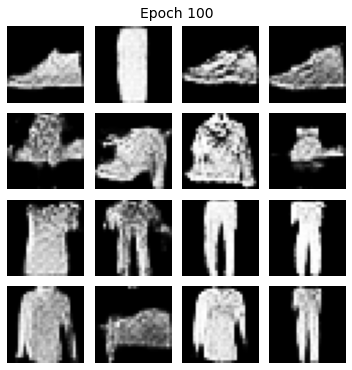

In [33]:
train(train_set, EPOCHS)

In [34]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoints_dir));

## <a name="vag">Visualisation avec un gif</a>

On peut visualiser avec un gif 

In [35]:
out_file = dcgan_path / 'fashion_mnist.gif'

In [36]:

with imageio.get_writer(out_file, mode='I') as writer:
    filenames = sorted(list(img_path.glob('*.png')))
    
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2 * (i ** 0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

Installé tensorflow docs au préalable pour afficher les gifs

In [37]:
pip install git+https://github.com/tensorflow/docs


  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-0z2rxfym
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-0z2rxfym
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0fd4c3ce3be5ba5901f4580b75b86c02a49e426bd_-cp37-none-any.whl size=147329 sha256=e3193952dfe38964dd3110fad89f757645662de9fa0c469bd1f227fbe65e8633
  Stored in directory: /tmp/pip-ephem-wheel-cache-f_ejmqk6/wheels/eb/1b/35/fce87697be00d2fc63e0b4b395b0d9c7e391a10e98d9a0d97f
Successfully built tensorflow-docs



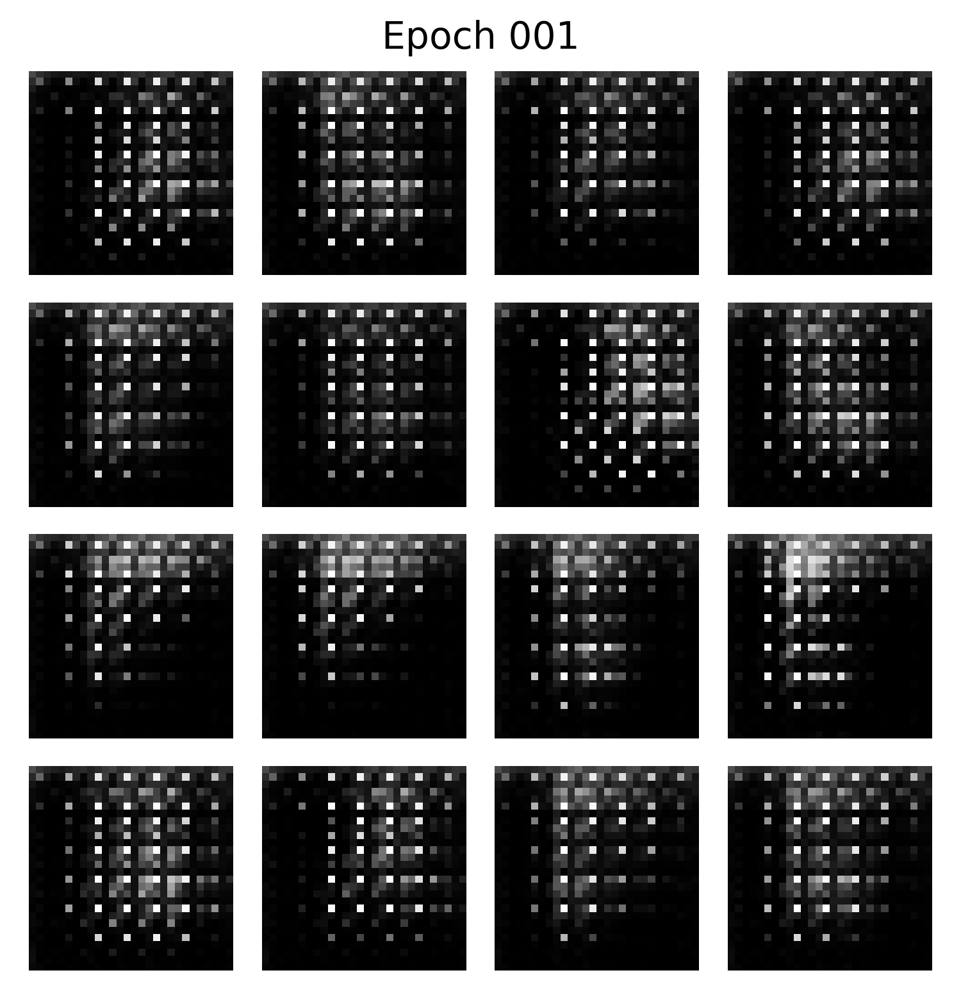

In [38]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(out_file)

# <a name="5">V. Conclusion </a>

Nous avons donc pu découvrir les GANs plus précisément les DCGANs, d'autre modèle de GANs dont nous pouvons voir un aperçu [ici](https://neptune.ai/blog/6-gan-architectures), éxistent , les GANs sont très récents, ils peuvent avoir de multiples cas d’usage. Il est possible de s’en servir pour imiter du contenu multimédia dans les films par exemnples généré un jumeau, des textes ou encore des discours..ou bien recréer une peinture ou une photo populaire. 

## <a name="ref">Références</a>

- [Tensorflow Réseau Adversaire Génératif Convolutionnel Profond: Mnist](https://www.tensorflow.org/tutorials/generative/dcgan)

- [Wiki: Réseaux antagonistes génératifs](https://fr.wikipedia.org/wiki/R%C3%A9seaux_antagonistes_g%C3%A9n%C3%A9ratifs#Goodfellows2014)
-[Github nd1511
/
PythonProgramming](https://github.com/nd1511/PythonProgramming/blob/master/program41_TrainData.py)

- [Google developers Gans Loss](https://developers.google.com/machine-learning/gan/loss)
